<a href="https://colab.research.google.com/github/GhoffarFitassin/PCVK_Ganjil_2025/blob/main/PCVKWeek11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# D. TUGAS PRAKTIKUM

## D1. Praktikum Deteksi Obyek Dasar


1. Load Data

In [ ]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

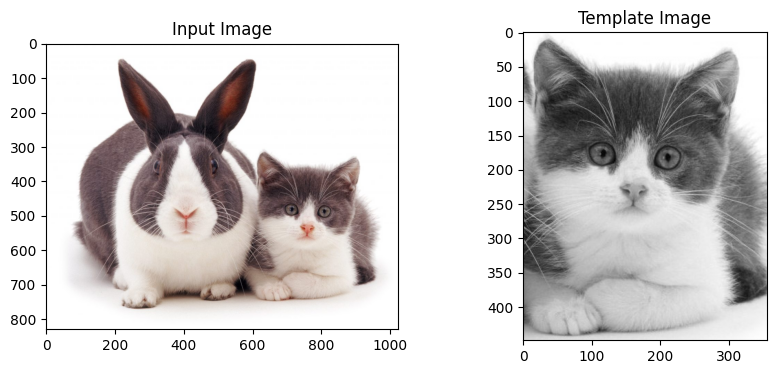

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/Object Detection/cats_and_bunnies.jpg'
template_path = '/content/drive/MyDrive/PCVK/Object Detection/cat2_templatejpg.jpg'

# Baca gambar
img_rgb = cv.imread(img_path)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
template = cv.imread(template_path, cv.IMREAD_GRAYSCALE)
h, w = template.shape

# Tampilkan gambar input & template
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_rgb, cv.COLOR_BGR2RGB))
plt.title('Input Image')

plt.subplot(1, 2, 2)
plt.imshow(template, cmap='gray')
plt.title('Template Image')
plt.show()

2. Implementasi 6 metode template matching pada OpenCV

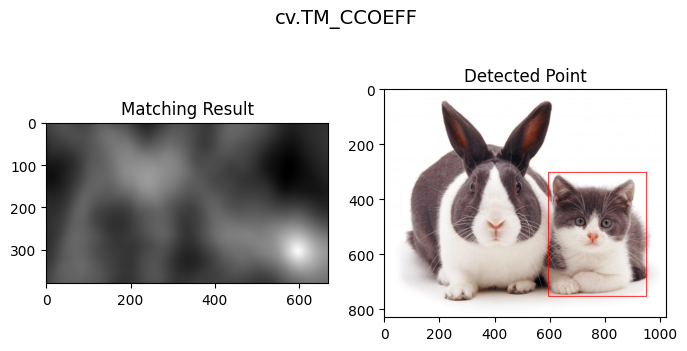

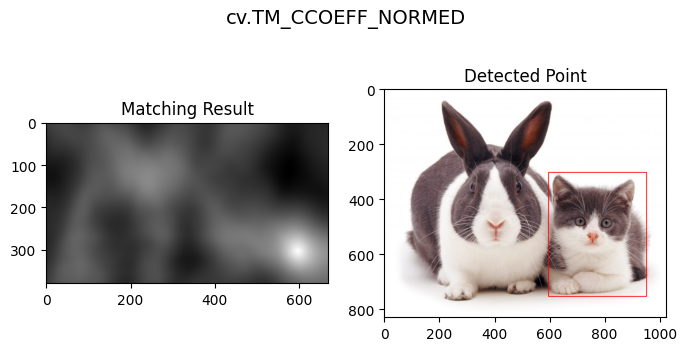

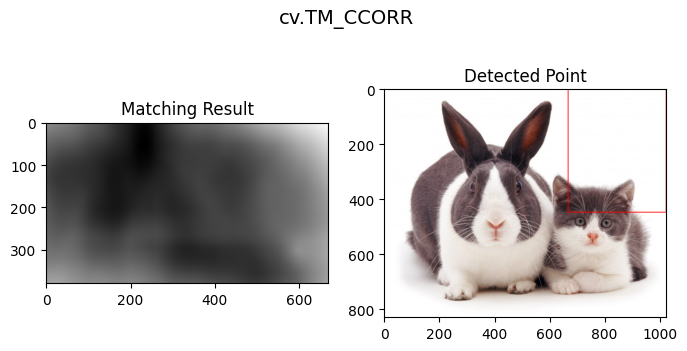

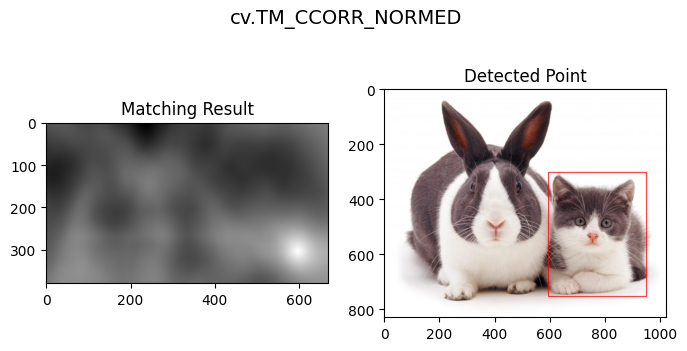

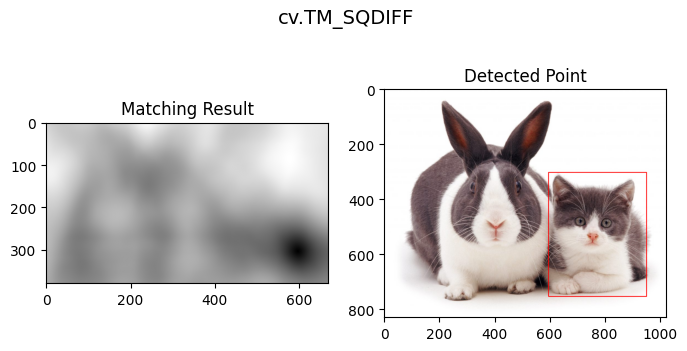

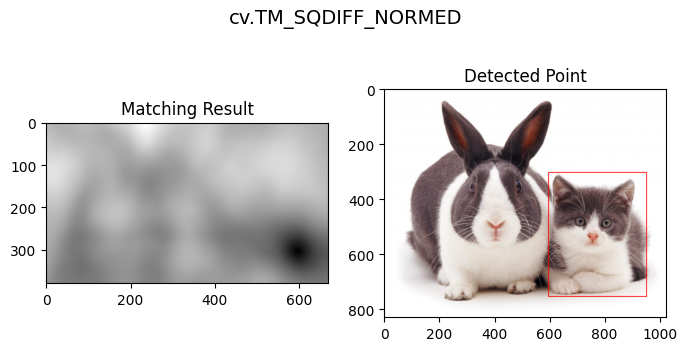

In [ ]:
methods = [
    ('cv.TM_CCOEFF', cv.TM_CCOEFF),
    ('cv.TM_CCOEFF_NORMED', cv.TM_CCOEFF_NORMED),
    ('cv.TM_CCORR', cv.TM_CCORR),
    ('cv.TM_CCORR_NORMED', cv.TM_CCORR_NORMED),
    ('cv.TM_SQDIFF', cv.TM_SQDIFF),
    ('cv.TM_SQDIFF_NORMED', cv.TM_SQDIFF_NORMED)
]

for name, method in methods:
    # Salin gambar
    img_copy = img_rgb.copy()

    # Lakukan template matching
    result = cv.matchTemplate(img_gray, template, method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

    # Pilih koordinat terbaik
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc

    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv.rectangle(img_copy, top_left, bottom_right, (0, 0, 255), 2)

    # Plot hasil
    plt.figure(figsize=(8, 4))
    plt.suptitle(name, fontsize=14)

    plt.subplot(1, 2, 1)
    plt.imshow(result, cmap='gray')
    plt.title('Matching Result')

    plt.subplot(1, 2, 2)
    plt.imshow(cv.cvtColor(img_copy, cv.COLOR_BGR2RGB))
    plt.title('Detected Point')

    plt.show()

3. Implementasi konsep template matching tanpa menggunakan library OpenCV
untuk multiple objec

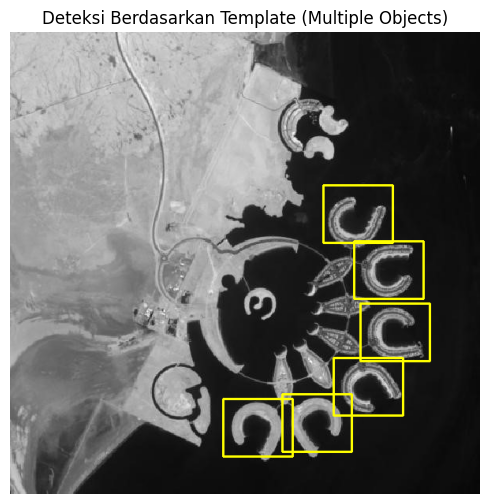

In [ ]:
# Path gambar dan template
img_path = '/content/drive/MyDrive/PCVK/Object Detection/bahrain.jpg'
template_path = '/content/drive/MyDrive/PCVK/Object Detection/bahrain-template.jpg'

# Baca gambar (grayscale)
img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
template = cv.imread(template_path, cv.IMREAD_GRAYSCALE)
img_color = cv.cvtColor(img, cv.COLOR_GRAY2BGR)

h, w = template.shape


def template_match_manual(image, template):
    ih, iw = image.shape
    th, tw = template.shape
    result = np.zeros((ih - th + 1, iw - tw + 1))

    template_mean = np.mean(template)
    template_std = np.std(template)
    template_norm = (template - template_mean) / (template_std + 1e-8)

    for y in range(result.shape[0]):
        for x in range(result.shape[1]):
            patch = image[y:y+th, x:x+tw]
            patch_mean = np.mean(patch)
            patch_std = np.std(patch)
            if patch_std < 1e-6:
                continue
            patch_norm = (patch - patch_mean) / patch_std
            result[y, x] = np.mean(patch_norm * template_norm)
    return result

# Proses deteksi
result = template_match_manual(img, template)

# Normalisasi hasil ke [0,1]
result = template_match_manual(img, template)
result_norm = (result - np.min(result)) / (np.max(result) - np.min(result))

# Threshold untuk mendeteksi multiple object
threshold = 0.65
coords = np.argwhere(result_norm >= threshold)

# Hindari kotak duplikat yang terlalu berdekatan
detected_points = []
min_distance = int(min(h, w) * 0.5)

for (y, x) in coords:
    # Cek apakah sudah ada kotak di sekitar titik ini
    if all(np.hypot(x - dx, y - dy) > min_distance for (dy, dx) in detected_points):
        detected_points.append((y, x))

# Gambar semua kotak hasil deteksi
for (y, x) in detected_points:
    cv.rectangle(img_color, (x, y), (x + w, y + h), (0, 255, 255), 2)


# VISUAL
plt.figure(figsize=(10, 6))
plt.title("Deteksi Berdasarkan Template (Multiple Objects)")
plt.imshow(cv.cvtColor(img_color, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

4. Implementasi metode Sobel Edge Detection, Canny Edge
Detection, dan Laplacian Edge Detection pada OpenCV

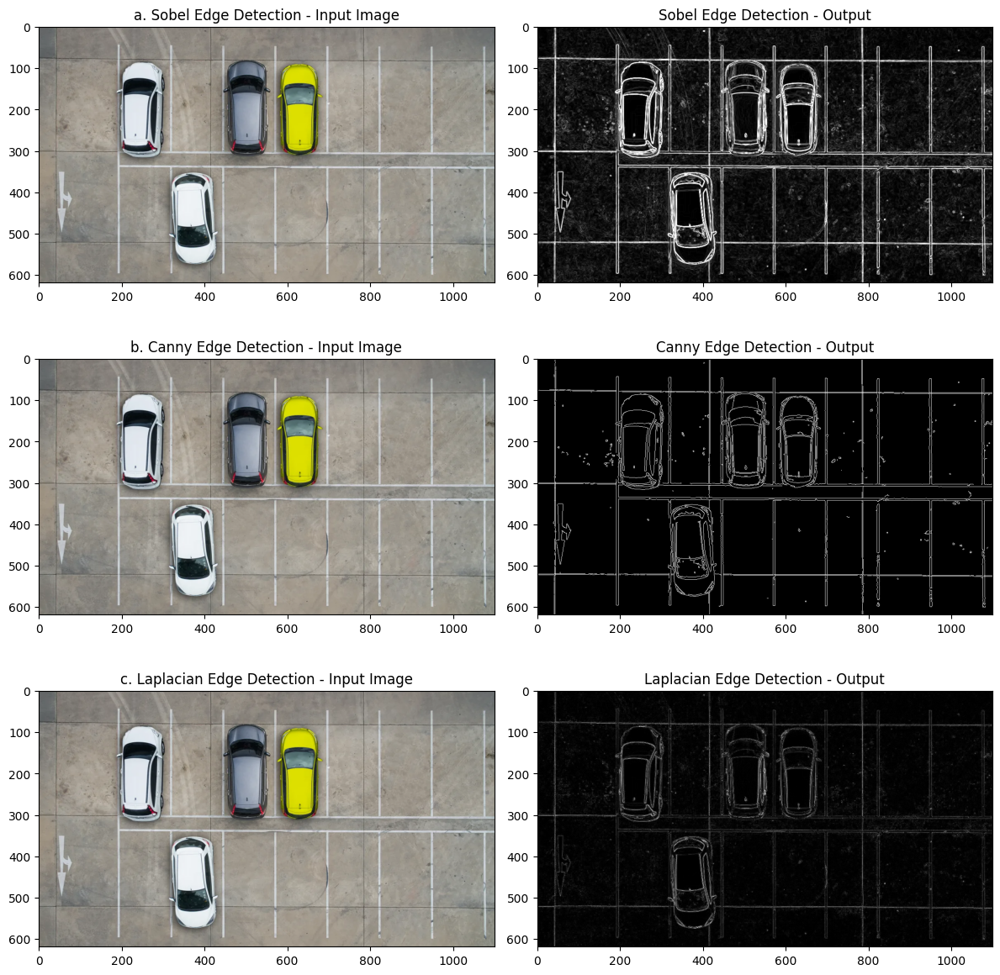

In [ ]:
# Path gambar
img_path = '/content/drive/MyDrive/PCVK/Object Detection/car-park.jpg'

# Baca gambar
img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# 1. SOBEL EDGE DETECTION
# Sobel X dan Y
sobelx = cv.Sobel(gray, cv.CV_64F, 1, 0, ksize=3)
sobely = cv.Sobel(gray, cv.CV_64F, 0, 1, ksize=3)

# Gabungkan (magnitude)
sobel_combined = cv.magnitude(sobelx, sobely)
sobel_combined = cv.convertScaleAbs(sobel_combined)

# 2. CANNY EDGE DETECTION
canny = cv.Canny(gray, 100, 200)

# 3. LAPLACIAN EDGE DETECTION
laplacian = cv.Laplacian(gray, cv.CV_64F)
laplacian = cv.convertScaleAbs(laplacian)

# VISUALISASI
plt.figure(figsize=(12, 12))

# a. Sobel
plt.subplot(3, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('a. Sobel Edge Detection - Input Image')

plt.subplot(3, 2, 2)
plt.imshow(sobel_combined, cmap='gray')
plt.title('Sobel Edge Detection - Output')

# b. Canny
plt.subplot(3, 2, 3)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('b. Canny Edge Detection - Input Image')

plt.subplot(3, 2, 4)
plt.imshow(canny, cmap='gray')
plt.title('Canny Edge Detection - Output')

# c. Laplacian
plt.subplot(3, 2, 5)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('c. Laplacian Edge Detection - Input Image')

plt.subplot(3, 2, 6)
plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian Edge Detection - Output')

plt.tight_layout()
plt.show()

5. Implementasi metode Harris Corner Detection dan Shi-Tomasi
Detection pada OpenCV

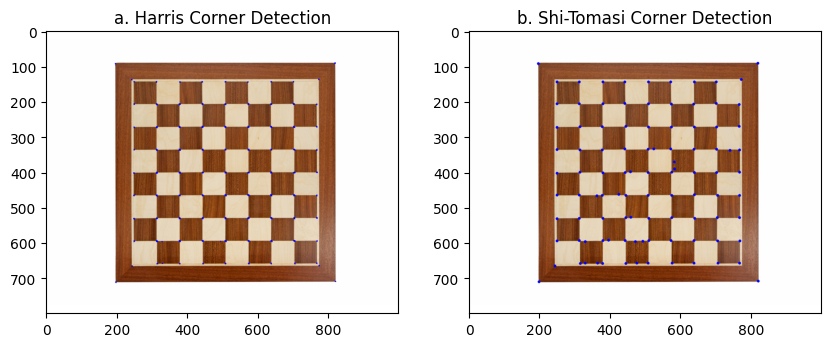

In [ ]:
# Path gambar
img_path = '/content/drive/MyDrive/PCVK/Object Detection/chess-board.jpg'

# Baca gambar
img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray = np.float32(gray)

# 1️. HARRIS CORNER DETECTION
# Gunakan Harris corner detector
dst = cv.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

# Dilasi agar sudut terlihat lebih jelas
dst_dilated = cv.dilate(dst, None)

# Threshold (titik dengan respons > 1% dari nilai max dianggap corner)
img_harris = img.copy()
img_harris[dst_dilated > 0.01 * dst_dilated.max()] = [255, 0, 0]  # warna merah

# 2. SHI-TOMASI CORNER DETECTION
img_shi = img.copy()
corners = cv.goodFeaturesToTrack(
    np.uint8(gray), maxCorners=100, qualityLevel=0.01, minDistance=10
)

# Convert dan gambar titik corner
corners = corners.astype(int)
for corner in corners:
    x, y = corner.ravel()
    cv.circle(img_shi, (x, y), 4, (255, 0, 0), -1)

# VISUALISASI
plt.figure(figsize=(10, 10))

# a. Harris Corner Detection
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_harris, cv.COLOR_BGR2RGB))
plt.title('a. Harris Corner Detection')

# b. Shi-Tomasi Corner Detection
plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(img_shi, cv.COLOR_BGR2RGB))
plt.title('b. Shi-Tomasi Corner Detection')

plt.show()

6. Implementasi metode Hough Transform pada OpenCV

Jumlah garis terdeteksi: 33
Jumlah garis setelah filter: 20


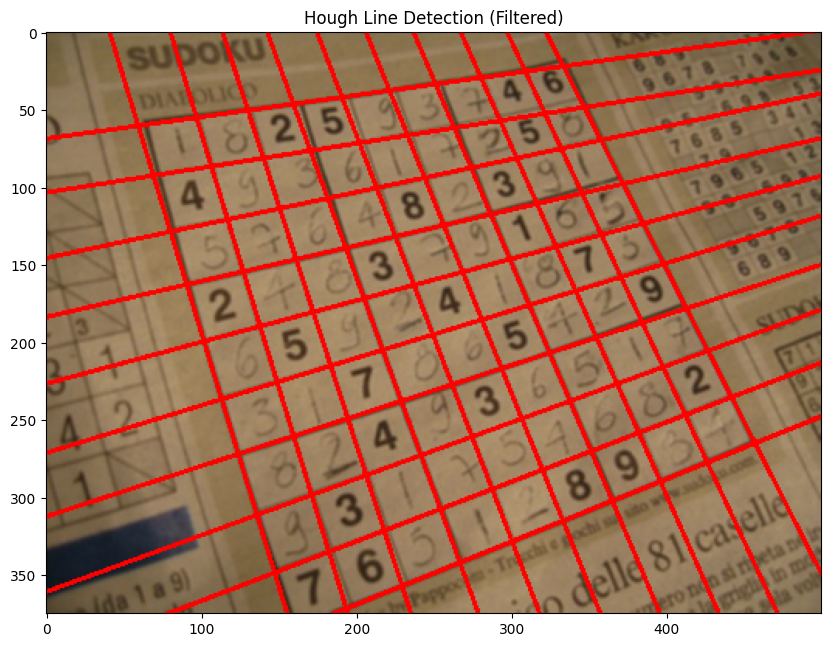

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca gambar dan ubah ke grayscale
img_path = '/content/drive/MyDrive/PCVK/Object Detection/sudoku.jpg'
img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# 2. Edge detection
edges = cv.Canny(gray, 90, 150, apertureSize=3)

# 3. Dilasi dan erosi untuk memperkuat garis
kernel = np.ones((3, 3), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)
kernel = np.ones((5, 5), np.uint8)
edges = cv.erode(edges, kernel, iterations=1)

# 4. Hough Line Transform
lines = cv.HoughLines(edges, 1, np.pi/180, 150)

if lines is None or not lines.any():
    print('No lines were found')
    exit()

# 5. Filter garis mirip agar tidak double
rho_threshold = 15
theta_threshold = 0.1  # ~6 derajat toleransi
filtered_lines = []

for i in range(len(lines)):
    rho, theta = lines[i][0]
    duplicate = False
    for rho2, theta2 in filtered_lines:
        if abs(rho - rho2) < rho_threshold and abs(theta - theta2) < theta_threshold:
            duplicate = True
            break
    if not duplicate:
        filtered_lines.append((rho, theta))

print("Jumlah garis terdeteksi:", len(lines))
print("Jumlah garis setelah filter:", len(filtered_lines))

# 6. Gambar garis hasil filter
img_lines = img.copy()
for rho, theta in filtered_lines:
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv.line(img_lines, (x1, y1), (x2, y2), (0, 0, 255), 2)

# 7. Tampilkan hasil
plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img_lines, cv.COLOR_BGR2RGB))
plt.title('Hough Line Detection (Filtered)')
plt.show()

7. Implementasi fungsi findContours() pada OpenCV untuk contour detection

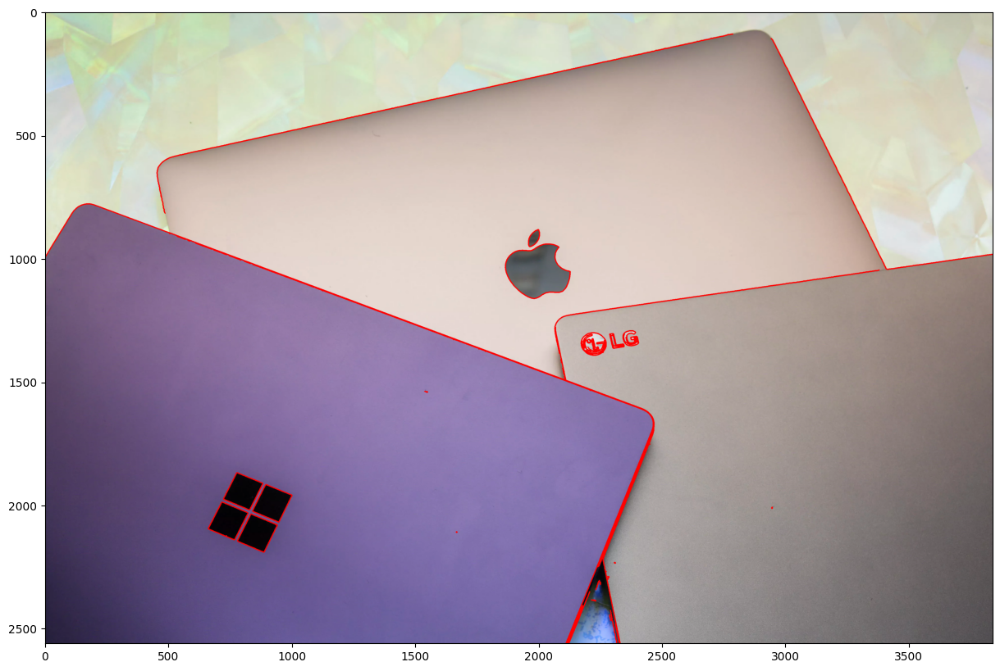

In [ ]:
# Path gambar laptop
img_laptop = '/content/drive/MyDrive/PCVK/Object Detection/laptop.jpg'

img = cv.imread(img_laptop)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Convert the image to grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Apply edge detection
edges = cv.Canny(gray, 60, 210, apertureSize=3)

# Find contours
contours, hierarchy = cv.findContours(edges, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

# Draw contours
cv.drawContours(img, contours, -1, (255, 0, 0), 3)

# Display the input image with the detected contours
plt.figure(figsize=(20,10))
plt.imshow(img)

## D2. Praktikum Feature Matching dan Face Detection

1. Lakukan Face Detection untuk image object lain yang tersedia pada (/images/facedet)

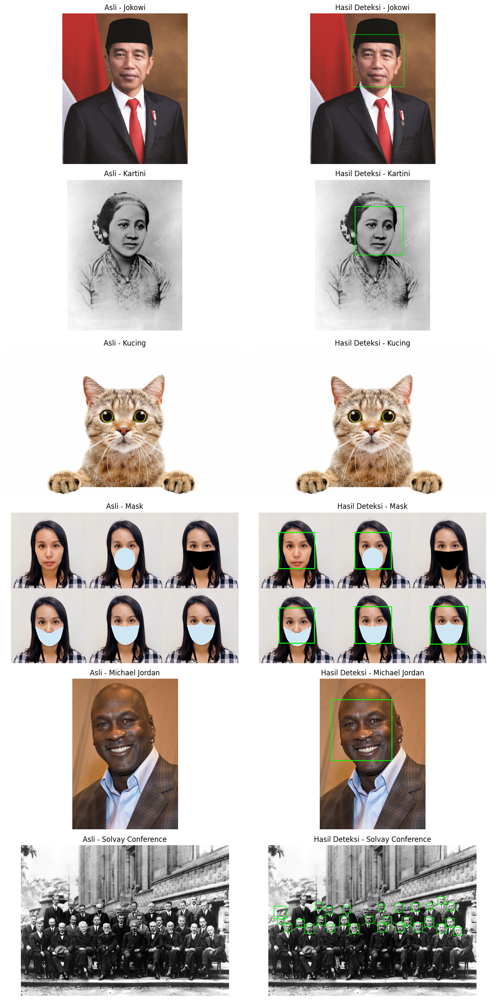

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# --- Setup Path Sesuai Modul 11 ---

# Path ke model Haar Cascade untuk deteksi wajah\
cascade_path = '/content/drive/MyDrive/PCVK/haarcascades/haarcascade_frontalface_alt.xml'

# Base path untuk gambar-gambar yang akan dideteksi
# (Sesuai instruksi Anda)
base_image_path = '/content/drive/MyDrive/PCVK/facedet/'

# Daftar file gambar yang Anda berikan
image_files = [
    'prabowo.jpg',
    'kartini.jpg',
    'kucing.jpg',
    'mask.png',
    'mjordan.jpg',
    'solvayconf.jpg'
]

# Judul untuk plotting
titles = [
    'Jokowi',
    'Kartini',
    'Kucing',
    'Mask',
    'Michael Jordan',
    'Solvay Conference'
]

# --- Memuat Cascade Classifier ---
face_cascade = cv.CascadeClassifier(cascade_path)

# Cek apakah classifier berhasil dimuat
if face_cascade.empty():
    print(f"Error: Tidak dapat memuat cascade classifier dari path:\n{cascade_path}")
    print("Pastikan file .xml ada di lokasi tersebut dan Google Drive sudah di-mount.")
else:
    # Siapkan list untuk menampung gambar
    original_images = []
    detected_images = []

    # --- Proses Setiap Gambar ---
    for filename in image_files:
        # Buat path lengkap ke gambar
        img_path = base_image_path + filename

        # Muat gambar
        img = cv.imread(img_path)

        if img is None:
            print(f"Peringatan: Gagal memuat gambar di {img_path}. Melanjutkan...")
            # Tambahkan placeholder agar plot tetap sinkron
            placeholder = np.zeros((100, 100, 3), dtype=np.uint8)
            original_images.append(placeholder)
            detected_images.append(placeholder)
            continue

        # Simpan gambar asli (versi RGB) untuk plotting
        original_images.append(cv.cvtColor(img, cv.COLOR_BGR2RGB))

        # Buat salinan gambar untuk digambari kotak
        img_detected = img.copy()

        # 1. Ubah ke grayscale untuk proses deteksi
        gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

        # 2. Lakukan deteksi wajah
        # Menggunakan parameter dasar seperti di modul
        faces = face_cascade.detectMultiScale(gray)

        # 3. Gambar kotak di sekeliling wajah yang terdeteksi
        for (x, y, w, h) in faces:
            # Menggambar kotak hijau (0, 255, 0) seperti contoh di hal. 29
            cv.rectangle(img_detected, (x, y), (x+w, y+h), (0, 255, 0), 2)

        # Simpan gambar yang sudah dideteksi (versi RGB)
        detected_images.append(cv.cvtColor(img_detected, cv.COLOR_BGR2RGB))

    # --- Tampilkan Hasil (Seperti layout Modul hal. 29) ---
    num_images = len(original_images)
    plt.figure(figsize=(12, num_images * 4))

    for i in range(num_images):
        # Tampilkan Gambar Asli
        plt.subplot(num_images, 2, i*2 + 1)
        plt.imshow(original_images[i])
        plt.title(f"Asli - {titles[i]}")
        plt.axis('off')

        # Tampilkan Gambar Hasil Deteksi
        plt.subplot(num_images, 2, i*2 + 2)
        plt.imshow(detected_images[i])
        plt.title(f"Hasil Deteksi - {titles[i]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

2. Pada Soal No.2. wajah kucing tidak bisa dideteksi dengan baik. Lakukan deteksi
wajah kucing hingga muncul rectangle pada bagian wajahnya. Petunjuk pada soal
ini, perhatikan pretrained features yang telah disediakan OpenCV. Gunakan xml
yang ada jika memang telah disediakan

Berhasil mendeteksi 1 wajah kucing.


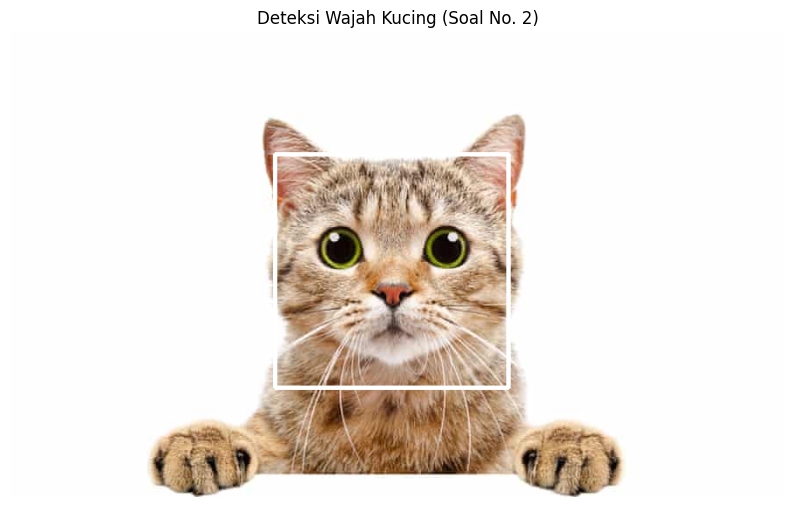

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Muat Classifier dan Gambar ---

# Nama file classifier untuk wajah kucing (Anda berikan)
# Ini sesuai petunjuk di Modul 11, hal. 30
cat_cascade_file = '/content/drive/MyDrive/PCVK/haarcascades/haarcascade_frontalcatface.xml'

# Nama file gambar kucing (Anda berikan)
image_file = '/content/drive/MyDrive/PCVK/facedet/kucing.jpg'

# Muat cascade classifier
cat_cascade = cv.CascadeClassifier(cat_cascade_file)

# Cek apakah classifier berhasil dimuat
if cat_cascade.empty():
    print(f"Error: Tidak dapat memuat cascade classifier dari file: {cat_cascade_file}")
else:
    # Muat gambar
    img = cv.imread(image_file)

    if img is None:
        print(f"Error: Gagal memuat gambar: {image_file}")
    else:
        # --- 2. Lakukan Deteksi Wajah Kucing ---

        # Ubah ke grayscale (langkah awal untuk Haar Cascades)
        gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

        # Lakukan deteksi wajah kucing
        faces = cat_cascade.detectMultiScale(
            gray,
            scaleFactor=1.05,
            minNeighbors=7,   # <- Filter deteksi yang lemah/terisolasi
            minSize=(100, 100)    # <- Atur ukuran minimum wajah yang dicari
        )

        # --- 3. Gambar Kotak dan Tampilkan Hasil ---

        # Salin gambar asli untuk digambari
        img_detected = img.copy()

        # Loop semua wajah yang terdeteksi
        for (x, y, w, h) in faces:
            # Gambar kotak putih (255, 255, 255)
            # Sesuai contoh hasil di Modul 11, hal. 30 [cite: 1664]
            cv.rectangle(img_detected, (x, y), (x+w, y+h), (255, 255, 255), 3) # Gunakan ketebalan 3 agar terlihat jelas

        # Tampilkan hasil menggunakan Matplotlib
        print(f"Berhasil mendeteksi {len(faces)} wajah kucing.")
        plt.figure(figsize=(10, 8))
        plt.imshow(cv.cvtColor(img_detected, cv.COLOR_BGR2RGB))
        plt.title("Deteksi Wajah Kucing (Soal No. 2)")
        plt.axis('off')
        plt.show()

3. Cobakan juga untuk eyes detection pada wajah Pak Prabowo:

Berhasil mendeteksi 1 wajah.


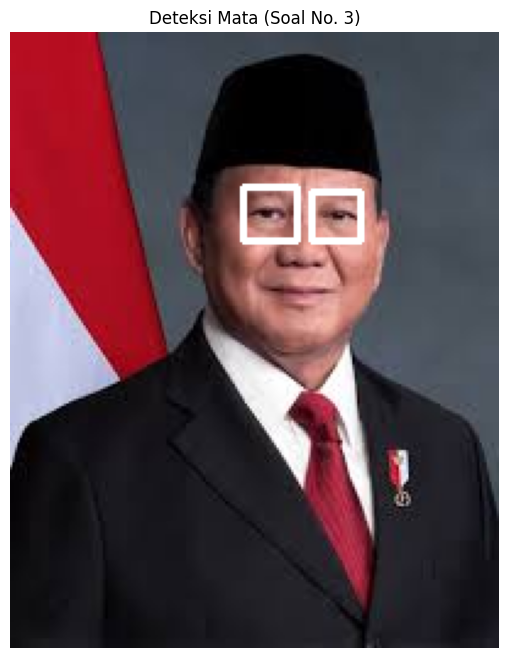

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Muat SEMUA Classifier yang Dibutuhkan ---

# Path ke file classifier (berdasarkan file yang Anda berikan)
face_cascade_file = '/content/drive/MyDrive/PCVK/haarcascades/haarcascade_frontalface_alt.xml'
eye_cascade_file = '/content/drive/MyDrive/PCVK/haarcascades/haarcascade_eye.xml'

# Path ke gambar
image_file = '/content/drive/MyDrive/PCVK/facedet/prabowo.jpg'

# Muat cascade classifier untuk WAJAH
# (Merujuk ke Modul 11 - Object Detection Method.pdf, halaman 21) [cite: 491]
face_cascade = cv.CascadeClassifier(face_cascade_file)

# Muat cascade classifier untuk MATA
eye_cascade = cv.CascadeClassifier(eye_cascade_file)

if face_cascade.empty() or eye_cascade.empty():
    print("Error: Salah satu file classifier (wajah atau mata) gagal dimuat.")
    print(f"Cek path: {face_cascade_file} dan {eye_cascade_file}")
else:
    # --- 2. Muat Gambar ---
    img = cv.imread(image_file)

    # Salin gambar untuk digambari kotak
    img_detected = img.copy()
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # --- 3. Tahap 1: Deteksi Wajah ---
    faces = face_cascade.detectMultiScale(
            gray,
            scaleFactor=1.05,
            minNeighbors=7,   # <- Filter deteksi yang lemah/terisolasi
            minSize=(100, 100)    # <- Atur ukuran minimum wajah yang dicari
        )

    # --- 4. Tahap 2: Deteksi Mata (di dalam ROI Wajah) ---

    for (x, y, w, h) in faces:
        # Tentukan Region of Interest (ROI) hanya pada area wajah
        roi_gray = gray[y:y+h, x:x+w]

        # Jalankan deteksi mata HANYA pada ROI grayscale
        eyes = eye_cascade.detectMultiScale(roi_gray)

        # Loop untuk setiap mata yang ditemukan di dalam ROI
        for (ex, ey, ew, eh) in eyes:
            # Gambar kotak di gambar ASLI (img_detected)
            # Perhatikan: Koordinat (ex, ey) ditambah (x, y) agar pas di gambar asli
            cv.rectangle(img_detected, (x + ex, y + ey), (x + ex + ew, y + ey + eh), (255, 255, 255), 2)

    # --- 5. Tampilkan Hasil ---

    print(f"Berhasil mendeteksi {len(faces)} wajah.")
    plt.figure(figsize=(10, 8))
    # Konversi BGR ke RGB untuk Matplotlib
    plt.imshow(cv.cvtColor(img_detected, cv.COLOR_BGR2RGB))
    plt.title("Deteksi Mata (Soal No. 3)")
    plt.axis('off')
    plt.show()

4. Lakukan deteksi senyuman pada gambar people:

Detected 9 face(s)
Face 1: Not Smiling (0 smile(s) detected)
Face 2: Not Smiling (0 smile(s) detected)
Face 3: Not Smiling (0 smile(s) detected)
Face 4: Not Smiling (0 smile(s) detected)
Face 5: Not Smiling (0 smile(s) detected)
Face 6: Not Smiling (0 smile(s) detected)
Face 7: Smiling (1 smile(s) detected)
Face 8: Smiling (1 smile(s) detected)
Face 9: Smiling (1 smile(s) detected)


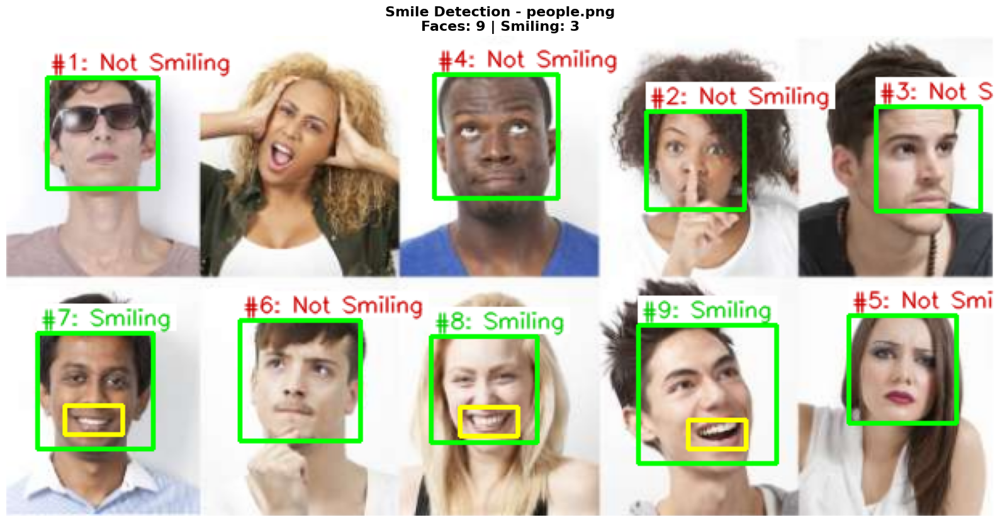

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Configuration
FOLDER_PATH = '/content/drive/MyDrive/PCVK/facedet'
CASCADE_PATH = '/content/drive/MyDrive/PCVK/haarcascades'
IMAGE_FILE = "people.png"

# Load cascade classifiers
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
smile_cascade = cv2.CascadeClassifier(os.path.join(CASCADE_PATH, "haarcascade_smile.xml"))

# Verify cascade loaded successfully
if smile_cascade.empty():
    print("Error: Could not load smile cascade classifier!")
    print(f"Path checked: {os.path.join(CASCADE_PATH, 'haarcascade_smile.xml')}")
    exit()

# Read image
img_path = os.path.join(FOLDER_PATH, IMAGE_FILE)
img = cv2.imread(img_path)

if img is None:
    print(f"Error: Could not load image from {img_path}")
    exit()

# Convert BGR to RGB for matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Convert to grayscale for detection only
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=5,
    minSize=(50, 50)
)

print(f"Detected {len(faces)} face(s)")

# Create copy for drawing (color)
img_result = img_rgb.copy()

# Initialize counters
total_smiles = 0
face_results = []

# Detect smiles in each face
for i, (x, y, w, h) in enumerate(faces):
    # Draw face rectangle (green)
    cv2.rectangle(img_result, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # ROI untuk deteksi senyuman - fokus pada area bawah wajah (50-95% dari atas)
    smile_region_y = y + int(h * 0.5)
    smile_region_h = int(h * 0.5)

    roi_gray = gray[smile_region_y:smile_region_y+smile_region_h, x:x+w]

    # Detect smiles with more sensitive parameters
    smiles = smile_cascade.detectMultiScale(
        roi_gray,
        scaleFactor=1.3,
        minNeighbors=8,
        minSize=(int(w * 0.2), int(h * 0.08)),
        maxSize=(int(w * 0.95), int(h * 0.5))
    )

    # Filter and select best smile detection
    filtered_smiles = []
    if len(smiles) > 0:
        # Sort by vertical position (lower in face = more likely to be mouth)
        # and by size
        smiles_scored = []
        for (sx, sy, sw, sh) in smiles:
            # Score based on position (prefer lower) and size
            position_score = sy  # Lower is better
            size_score = sw * sh
            total_score = position_score + (size_score / 100)
            smiles_scored.append((sx, sy, sw, sh, total_score))

        # Sort by score (higher is better for position, larger for size)
        smiles_scored.sort(key=lambda s: s[4], reverse=True)

        # Take the best detection
        sx, sy, sw, sh, _ = smiles_scored[0]
        abs_sx = x + sx
        abs_sy = smile_region_y + sy
        filtered_smiles.append((abs_sx, abs_sy, sw, sh))

    total_smiles += len(filtered_smiles)

    # Store results
    face_results.append({
        'face_id': i + 1,
        'position': (x, y, w, h),
        'smiling': len(filtered_smiles) > 0,
        'smile_count': len(filtered_smiles)
    })

    # Draw smile rectangles (yellow)
    for (sx, sy, sw, sh) in filtered_smiles:
        cv2.rectangle(img_result, (sx, sy), (sx+sw, sy+sh), (255, 255, 0), 2)

    # Add label with background for better readability
    status = "Smiling" if len(filtered_smiles) > 0 else "Not Smiling"
    label_color = (0, 200, 0) if len(filtered_smiles) > 0 else (200, 0, 0)
    label_text = f"#{i+1}: {status}"

    # Calculate text size for background
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.45
    thickness = 1
    (text_width, text_height), baseline = cv2.getTextSize(label_text, font, font_scale, thickness)

    # Draw background rectangle
    bg_color = (255, 255, 255)
    cv2.rectangle(img_result,
                  (x, y - text_height - 8),
                  (x + text_width + 4, y - 2),
                  bg_color, -1)

    # Draw text
    cv2.putText(img_result, label_text,
                (x + 2, y - 5), font,
                font_scale, label_color, thickness, cv2.LINE_AA)

    print(f"Face {i+1}: {status} ({len(filtered_smiles)} smile(s) detected)")

# Visualization
plt.figure(figsize=(16, 12))
plt.imshow(img_result)
plt.title(f'Smile Detection - {IMAGE_FILE}\nFaces: {len(faces)} | Smiling: {total_smiles}',
          fontsize=16, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

5. Lakukan Face Tracking menggunakan Google Colab. Petunjuk, Tutorial
selengkapnya tentang akses kamera dan FaceDetection pada google colab dapat
dilihat di link berikut: https://www.youtube.com/watch?v=YjWh7QvVH60

In [ ]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes


In [ ]:
# initialize the Haar Cascade face detection model
face_cascade = cv2.CascadeClassifier(cv2.samples.findFile(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'))

In [ ]:
# Webcam Images
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  img = js_to_image(data)
  # grayscale img
  gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  print(gray.shape)
  # get face bounding box coordinates using Haar Cascade
  faces = face_cascade.detectMultiScale(gray)
  # draw face bounding box on image
  for (x,y,w,h) in faces:
      img = cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
  # save image
  cv2.imwrite(filename, img)

  return filename

<IPython.core.display.Javascript object>

(480, 640)
Saved to photo.jpg


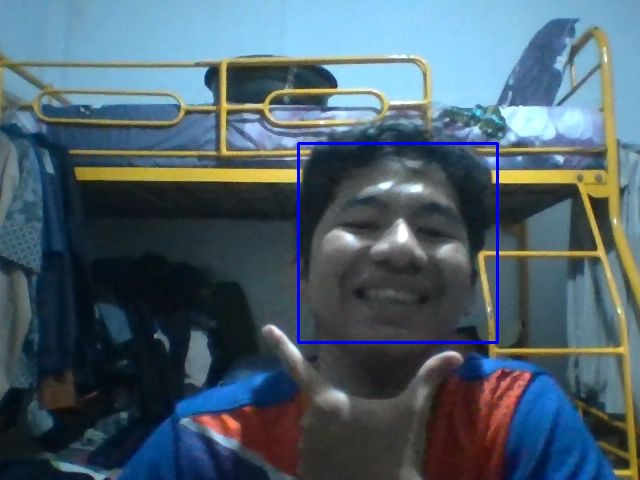

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;

    var pendingResolve = null;
    var shutdown = false;

    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }

    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }

    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);

      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);

      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);

      const instruction = document.createElement('div');
      instruction.innerHTML =
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };

      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);

      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();

      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }

      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }

      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;

      return {'create': preShow - preCreate,
              'show': preCapture - preShow,
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)

def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

In [ ]:
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0
while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # convert JS response to OpenCV Image
    img = js_to_image(js_reply["img"])

    # create transparent overlay for bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8)

    # grayscale image for face detection
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # get face region coordinates
    faces = face_cascade.detectMultiScale(gray)
    # get face bounding box for overlay
    for (x,y,w,h) in faces:
      bbox_array = cv2.rectangle(bbox_array,(x,y),(x+w,y+h),(255,0,0),2)

    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255
    # convert overlay of bbox into bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
    # update bbox so next frame gets new overlay
    bbox = bbox_bytes

<IPython.core.display.Javascript object>

/tmp/ipython-input-3296070078.py:38: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')


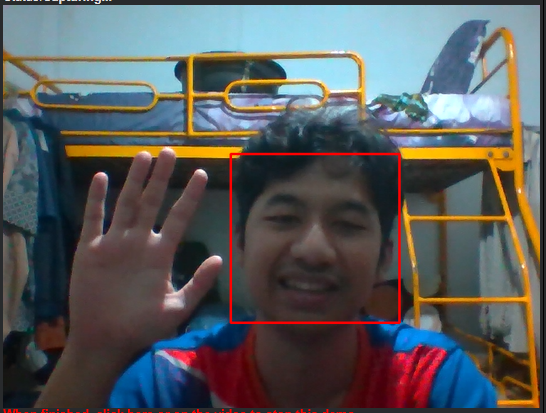

6. Lakukan Blurring pada bagian wajah yang terdeteksi. Berikut contoh keluarannya. Petunjuk: anda dapat menggunakan cv.medianBlur untuk melakukan Blurring

In [ ]:
video_stream()
label_html = 'Detecting & Blurring Faces...'
bbox = ''

while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # Ambil frame dari kamera
    img = js_to_image(js_reply["img"])
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 5)

    # Blur area wajah
    for (x, y, w, h) in faces:
        roi = img[y:y+h, x:x+w]
        if roi.size > 0:
            roi_blur = cv2.medianBlur(roi, 45)
            img[y:y+h, x:x+w] = roi_blur

        # Kotak wajah (opsional)
        cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

    # 💡 Konversi hasil blur ke format stream TANPA overlay
    _, buffer = cv2.imencode('.jpg', cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    bbox = 'data:image/jpeg;base64,' + b64encode(buffer).decode()

<IPython.core.display.Javascript object>

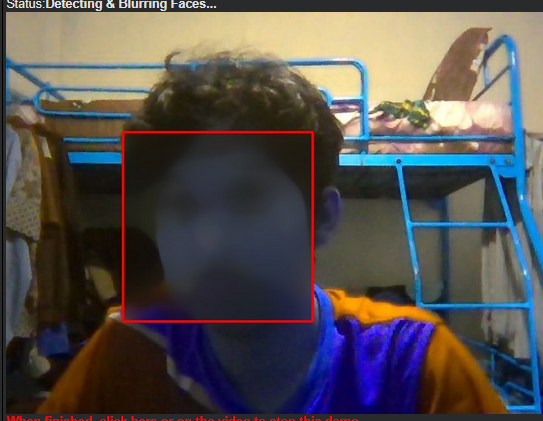

### 7. Mengolah gambar KTM masing-masing

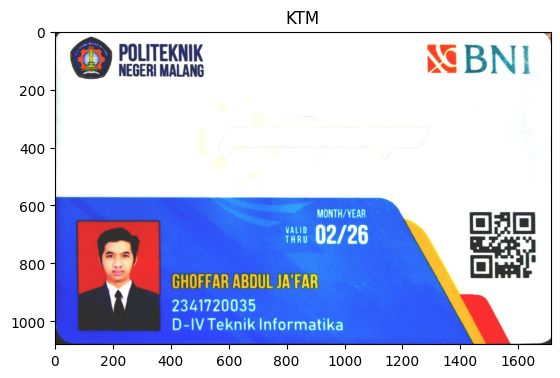

In [ ]:
import cv2
import matplotlib.pyplot as plt

def resize_with_ratio(img, target_width=None, target_height=None):
    """
    Resize gambar dengan menjaga aspect ratio.
    - target_width: lebar yang diinginkan (px)
    - target_height: tinggi yang diinginkan (px)
    Salah satu boleh None, nanti dihitung otomatis.
    """
    h, w = img.shape[:2]
    if target_width is not None and target_height is None:
        ratio = target_width / w
        new_size = (target_width, int(h * ratio))
    elif target_height is not None and target_width is None:
        ratio = target_height / h
        new_size = (int(w * ratio), target_height)
    else:
        raise ValueError("Isi salah satu: target_width atau target_height")

    resized = cv2.resize(img, new_size, interpolation=cv2.INTER_AREA)
    return resized

# --- Contoh penggunaan ---
ktm_path = "/content/drive/MyDrive/PCVK/KTM/KTM GHOFFAR.jpg"
img = cv2.imread(ktm_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

resized_img = resize_with_ratio(img_rgb, target_height=1080)

plt.imshow(resized_img)
plt.title("KTM")
plt.show()

b. Tampilkan Foto KTM seperti contoh berikut ini:

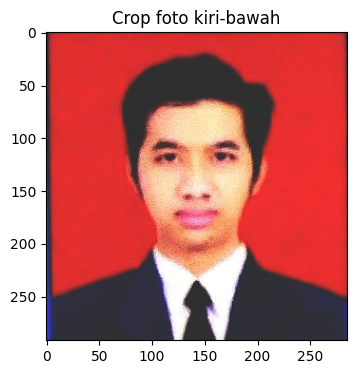

In [ ]:
h, w = resized_img.shape[:2]

# Definisikan ROI foto secara relatif
x0 = 75
x1 = 360
y0 = int(0.61 * h)
y1 = int(0.88 * h)

photo_cropped = resized_img[y0:y1, x0:x1]

# Tampilkan hasil
plt.figure(figsize=(4,4))
plt.imshow(photo_cropped)  # Langsung aja, sudah RGB
plt.title("Crop foto kiri-bawah")
plt.show()

c. Lakukan Deteksi Obyek KTM pada gambar yang berisi KTM dengan barang lainnya dengan menggunakan Konsep Feature Matching

Template foto: (1080, 1713), Keypoints: 2000

Mendeteksi pada: KTM GHOFFAR.jpg
Scene size after resize: (1080, 1713)
Total matches: 2000, Good matches: 40
Objek KTM terdeteksi.


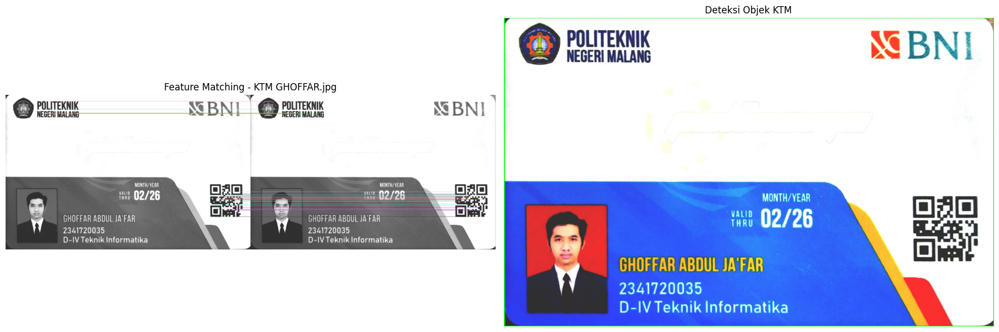


Mendeteksi pada: KTM BARU.jpg
Scene size after resize: (1080, 1920)
Total matches: 661, Good matches: 40
Objek KTM terdeteksi.


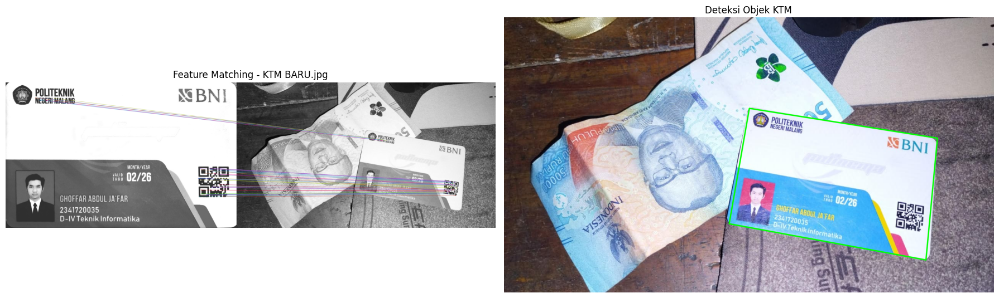

In [ ]:
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt

folder_path = "/content/drive/MyDrive/PCVK/KTM/"

# Template (hasil crop dari langkah sebelumnya) - konversi ke grayscale
template_img = cv2.cvtColor(resized_img, cv2.COLOR_RGB2GRAY)

# Buat ORB detector
orb = cv2.ORB_create(nfeatures=2000)

# Deteksi keypoint dan deskriptor untuk template
kp1, des1 = orb.detectAndCompute(template_img, None)

print(f"Template foto: {template_img.shape}, Keypoints: {len(kp1)}")

# Loop semua gambar di folder KTM
for scene_path in glob.glob(f"{folder_path}/*.jpg"):
    # Lewati jika gambar adalah template sendiri
    if "KTM_OHIM.png" in scene_path:
        continue

    print(f"\nMendeteksi pada: {scene_path.split('/')[-1]}")

    # Baca gambar scene
    scene_img_original = cv2.imread(scene_path)
    scene_img_rgb = cv2.cvtColor(scene_img_original, cv2.COLOR_BGR2RGB)

    # Resize dengan rasio yang sama
    scene_img_resized = resize_with_ratio(scene_img_rgb, target_height=1080)

    # Konversi ke grayscale untuk feature matching
    scene_img = cv2.cvtColor(scene_img_resized, cv2.COLOR_RGB2GRAY)

    print(f"Scene size after resize: {scene_img.shape}")

    # Deteksi keypoint dan deskriptor untuk scene
    kp2, des2 = orb.detectAndCompute(scene_img, None)

    if des2 is None or len(kp2) == 0:
        print("Tidak ada keypoint terdeteksi di scene.")
        continue

    # BFMatcher + crossCheck
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    # Ambil beberapa match terbaik
    good_matches = matches[:40]

    print(f"Total matches: {len(matches)}, Good matches: {len(good_matches)}")

    # Estimasi Homography (posisi KTM di scene)
    if len(good_matches) > 10:
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)

        # Gunakan RANSAC untuk estimasi homografi
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        if M is not None:
            h, w = template_img.shape
            pts = np.float32([[0,0],[0,h],[w,h],[w,0]]).reshape(-1,1,2)
            dst = cv2.perspectiveTransform(pts, M)

            # Gambar kotak hasil deteksi di gambar RGB
            scene_img_color = scene_img_resized.copy()
            cv2.polylines(scene_img_color, [np.int32(dst)], True, (0,255,0), 3, cv2.LINE_AA)
            print("Objek KTM terdeteksi.")
        else:
            scene_img_color = scene_img_resized.copy()
            print("Homography gagal dihitung.")
    else:
        scene_img_color = scene_img_resized.copy()
        print("Match terlalu sedikit untuk estimasi posisi.")

    # Tampilkan hasil
    result = cv2.drawMatches(template_img, kp1, scene_img, kp2, good_matches, None, flags=2)

    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    # Matching result
    axes[0].imshow(result, cmap='gray')
    axes[0].set_title(f"Feature Matching - {scene_path.split('/')[-1]}")
    axes[0].axis('off')

    # Detection result
    axes[1].imshow(scene_img_color)
    axes[1].set_title("Deteksi Objek KTM")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()